In [29]:
%matplotlib inline
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab

import matplotlib.patches as patches # For bounding boxes
from PIL import Image
from collections import defaultdict
import json
from tqdm import tqdm_notebook
import os 
import urllib.request


plt.rcParams['figure.figsize'] = (15, 15)

## COCO PythonAPI

First we download COCO's annotation files and then put these json files into COCOdataset2017/annotations/.


In [30]:
# Download and unzip annotations
# !wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
# !unzip annotations_trainval2017.zip
# !rm annotations_trainval2017.zip
# !mkdir COCOdataset2017
# !mv annotations COCOdataset2017/

# Download dada set

In [31]:
!pip install tqdm

Defaulting to user installation because normal site-packages is not writeable


In [32]:
dataDir = "COCOdataset2017"

dataValType   = 'val2017'
dataTrainType = 'train2017'

annValFile   ='{}/annotations/instances_{}.json'.format(dataDir,dataValType)
annTrainFile ='{}/annotations/instances_{}.json'.format(dataDir,dataTrainType)

In [33]:
# init COCO api for instance annotations 

cocoTrain = COCO(annTrainFile)
cocoVal   = COCO(annValFile)

loading annotations into memory...
Done (t=40.02s)
creating index...
index created!
loading annotations into memory...
Done (t=2.02s)
creating index...
index created!


In [34]:
# Get all categories
cats = cocoTrain.loadCats(cocoTrain.getCatIds())

# Print categories
nms=[cat['name'] for cat in cats]
print(f"{len(cats)} categories: \n{', '.join(nms)}")

80 categories: 
person, bicycle, car, motorcycle, airplane, bus, train, truck, boat, traffic light, fire hydrant, stop sign, parking meter, bench, bird, cat, dog, horse, sheep, cow, elephant, bear, zebra, giraffe, backpack, umbrella, handbag, tie, suitcase, frisbee, skis, snowboard, sports ball, kite, baseball bat, baseball glove, skateboard, surfboard, tennis racket, bottle, wine glass, cup, fork, knife, spoon, bowl, banana, apple, sandwich, orange, broccoli, carrot, hot dog, pizza, donut, cake, chair, couch, potted plant, bed, dining table, toilet, tv, laptop, mouse, remote, keyboard, cell phone, microwave, oven, toaster, sink, refrigerator, book, clock, vase, scissors, teddy bear, hair drier, toothbrush


We would try to download and benchmark mdeoks in sub categoricals 

In [35]:
def getImages(coco, subCats):

    # Specify classes to download
    catIds      = coco.getCatIds(catNms=subCats)

    # get image ids
    imgIds = coco.getImgIds(catIds=catIds)

    # Load images ids
    images = coco.loadImgs(imgIds)

    return catIds, imgIds, images 

In [36]:
subCats = ['person', 'car', 'bicycle']

In [37]:
catTrainIds, imgTrainIds, trainImages = getImages(cocoTrain, subCats)
catValIds, imgValIds, valImages   = getImages(cocoVal, subCats)

In [38]:
print(f"number of 2017 training   COCO images in {subCats} is {len(trainImages)}")
print(f"number of 2017 validation COCO images in {subCats} is {len(valImages)}")

number of 2017 training   COCO images in ['person', 'car', 'bicycle'] is 1101
number of 2017 validation COCO images in ['person', 'car', 'bicycle'] is 45


In [39]:
trainImages[0]

{'license': 3,
 'file_name': '000000247808.jpg',
 'coco_url': 'http://images.cocodataset.org/train2017/000000247808.jpg',
 'height': 640,
 'width': 378,
 'date_captured': '2013-11-23 05:08:51',
 'flickr_url': 'http://farm1.staticflickr.com/199/485431395_f55e8bb06d_z.jpg',
 'id': 247808}

each item image is presented by:

- license: It represents the license type or identifier associated with the image.

- file_name: This item contains the name or filename of the image file.

- coco_url: It provides the URL or web address where the image can be accessed or downloaded from the COCO dataset.

- height: It denotes the height of the image in pixels. 

- width: It represents the width of the image in pixels. 

- date_captured: This item indicates the date and time when the image was captured or created. 

- flickr_url: It provides the URL or web address of the image on the Flickr platform. This link allows you to view the image on Flickr.

- id: It - is a unique identifier for the image in the COCO dataset. 

In [40]:
# Download images 
def download_images(imagesJson, img_folder):

    if (not os.path.exists(img_folder)):
        os.makedirs(img_folder)

    for im in tqdm_notebook(imagesJson):
            im_path = os.path.join(img_folder, im['file_name'])
            if not os.path.exists(im_path):
                    urllib.request.urlretrieve(im['coco_url'], im_path)

In [41]:
DATA_SOURCE_DIR = "./COCOdataset2017/images"

ANN_DIR   = os.path.join(DATA_SOURCE_DIR, "annotations")
TRAIN_DIR = os.path.join(DATA_SOURCE_DIR, "train")
VAL_DIR   = os.path.join(DATA_SOURCE_DIR, "val")
TEST_DIR  = os.path.join(DATA_SOURCE_DIR, "test")

In [42]:
download_images(trainImages, TRAIN_DIR)
download_images(valImages, VAL_DIR)

/tmp/ipykernel_5529/566167332.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for im in tqdm_notebook(imagesJson):


  0%|          | 0/1101 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

In [43]:
print("the number of training   data set images : ", len(os.listdir(TRAIN_DIR)))
print("the number of validation data set images : ", len(os.listdir(VAL_DIR)))

the number of training   data set images :  1101
the number of validation data set images :  45


## Get annotations for image


Below is an example annotation, which is a dictionary with:

- id: int,
- category_id: int,
- image_id: int,
- iscrowd: a single object (iscrowd=0) or a collection of objects (iscrowd=1),
- area: float,
- bbox: coordinates of unnormalized bounding box in (cx, cy, w, h) format,
- segmentation: coordinates of polygon segmentation mask


In [44]:
cat_index_to_name = dict()
cat_name_to_index = dict()

for cat in cats:
    cat_index_to_name[cat['id']]   = cat['name']
    cat_name_to_index[cat['name']] = cat['id']

# Select random images and show annotations

Coco bbox format x, y, w, h where (x, y) is coordiante  of the top left corner of the box (w, h) the width and height of the box.

We have to transform it to an approriate format.

Matplotlib Pyplot plots a rectangle with origin in top-left corner.

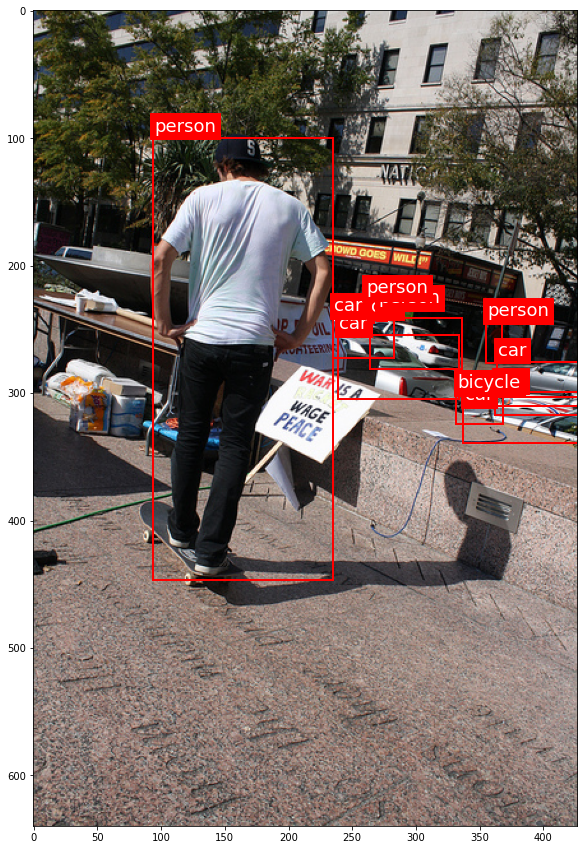

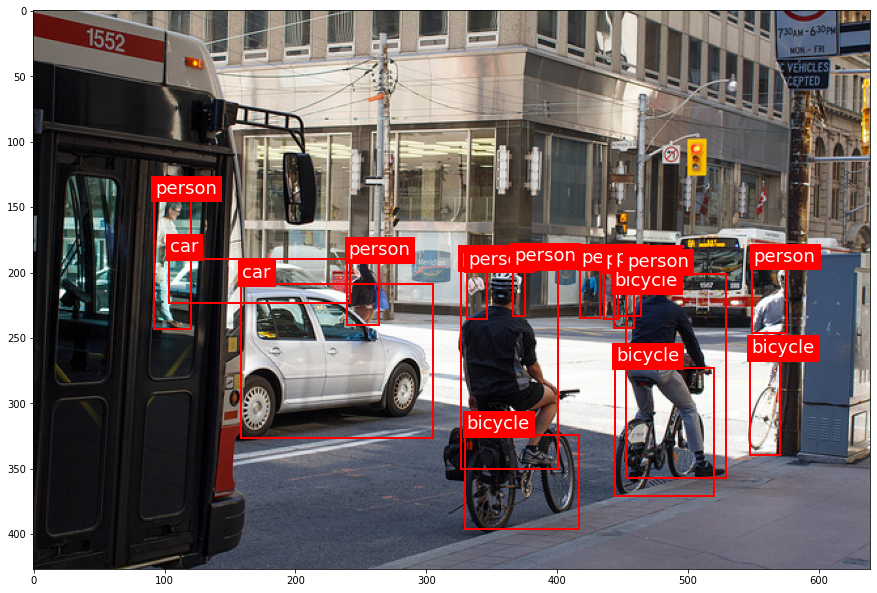

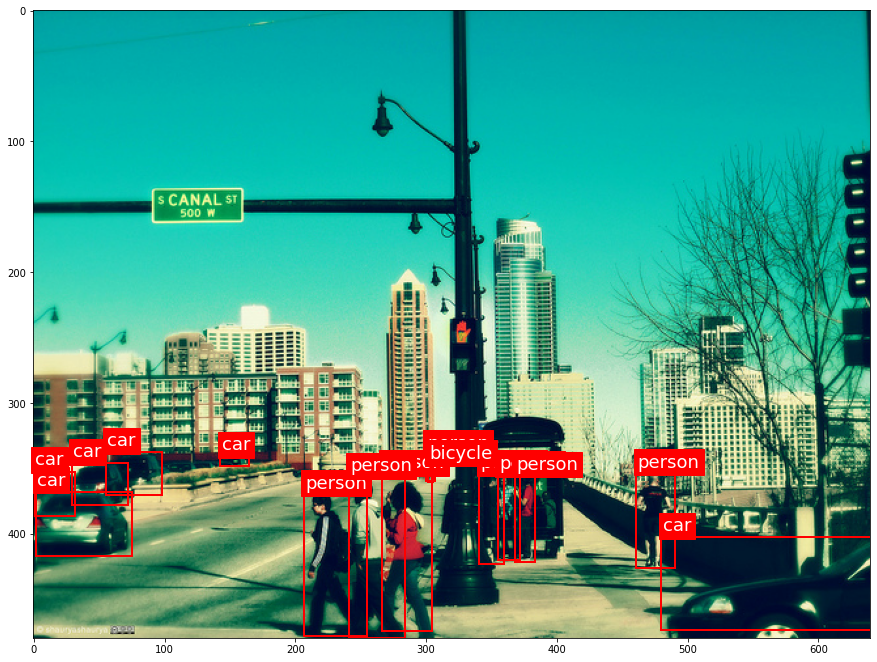

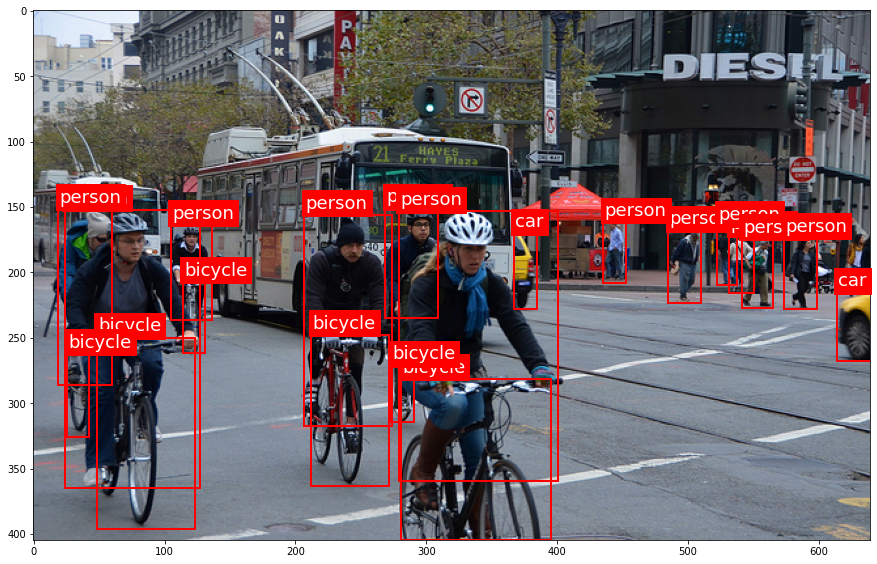

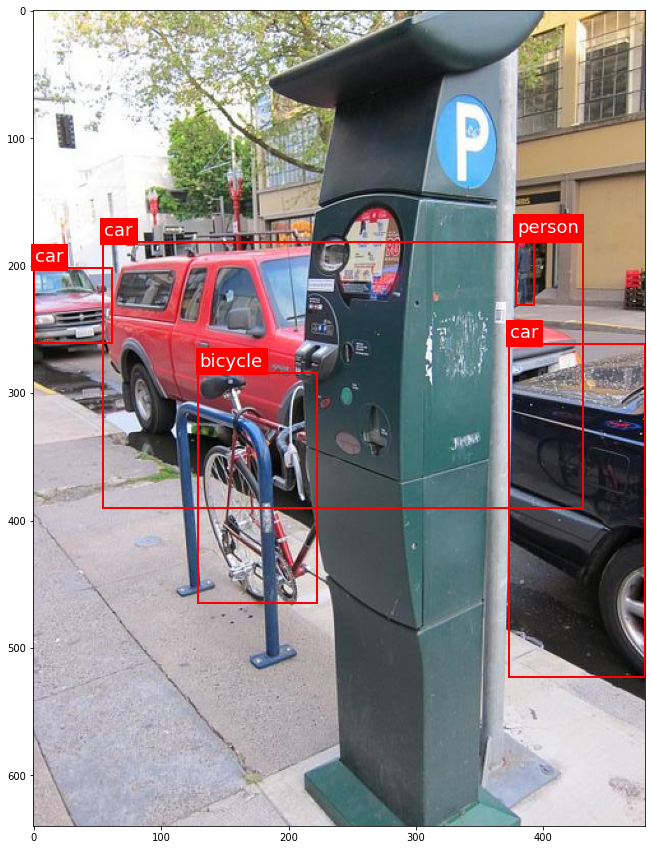

In [45]:
# load instance annotations

for i in range(5):
    
    fig, ax = plt.subplots()
    
    # random image, get all anns 
    img = trainImages[np.random.randint(0, len(trainImages))]
    annIds = cocoTrain.getAnnIds(img['id'], catIds=catTrainIds, iscrowd=None)
    anns   = cocoTrain.loadAnns(annIds)

    # visualize an image
    img = Image.open(os.path.join(TRAIN_DIR, img['file_name']))

    # visualize bbox im image
    for ann in anns:
        bbox = ann['bbox']
        name_cat = cat_index_to_name[ann['category_id']]

        # extract bbox coordinates
        x = float(bbox[0])
        y = float(bbox[1])
        w = float(bbox[2])
        h = float(bbox[3])

        # add text and bbox
        plt.text(x+1, y-5, name_cat,fontdict={'fontsize':18.0, 'fontweight':'medium','color': 'white', 'backgroundcolor':'red'})
        bb = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(bb)

    ax.imshow(img)

plt.show()

# Research each step of yolo model

In [46]:
# import required packages
import cv2
import argparse
import numpy as np
import os 

In [47]:
YOLO_DIR      = "yolo"
YOLO_SETTINGS = os.path.join(YOLO_DIR, "yolo_settings")
YOLO_CFG     = os.path.join(YOLO_SETTINGS, "yolov3.cfg")
YOLO_WEIGHTS = os.path.join(YOLO_SETTINGS, "yolov3.weights")

In [48]:
img = trainImages[np.random.randint(0, len(trainImages))]
inputImage = cv2.imread(os.path.join(TRAIN_DIR, img['file_name']))

print(f"input size : {inputImage.shape}")

net = cv2.dnn.readNetFromDarknet(YOLO_CFG, 
                                YOLO_WEIGHTS)

input size : (435, 640, 3)


Text(0.5, 1.0, 'original image')

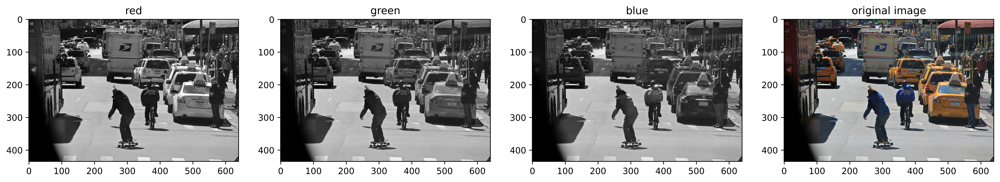

In [49]:
fig, axs = plt.subplots(1, 4)

fig.set_dpi(1000)
fig.set_size_inches(20,20)
b ,g, r = cv2.split(inputImage)

axs[0].imshow(r, cmap='gray')
axs[0].set_title('red')
axs[1].imshow(g, cmap='gray')
axs[1].set_title('green')
axs[2].imshow(b, cmap='gray')
axs[2].set_title('blue')
axs[3].imshow(cv2.cvtColor(inputImage, cv2.COLOR_BGR2RGB))
axs[3].set_title('original image')

In [50]:
scaleFactor       = float(1/255)
inputImageSize    = (416 , 416)
meanValToSubtract = (0, 0, 0)

inputBlob = cv2.dnn.blobFromImage(inputImage, scaleFactor, inputImageSize, True, False)

In [51]:
fig, axs = plt.subplots(1, 4)
fig.set_dpi(1000)
fig.set_size_inches(20,20)

axs[0].imshow(inputBlob[0][0], cmap = 'gray')
axs[0].set_title('red')
axs[1].imshow(inputBlob[0][1], cmap = 'gray')
axs[1].set_title('green')
axs[2].imshow(inputBlob[0][2], cmap = 'gray')
axs[2].set_title('blue')

result = cv2.merge([inputBlob[0][0], inputBlob[0][1], inputBlob[0][2]])
axs[3].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB)) 
axs[3].set_title('blob')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'blob')

In [52]:

def get_output_layers(net):
    
    layer_names = net.getLayerNames()
    try:
        output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]
    except:
        output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]

    return output_layers


net.setInput(inputBlob)
outputs = net.forward(get_output_layers(net))

print(len(outputs))
for out in outputs:
    print(out.shape)

3
(507, 85)
(2028, 85)
(8112, 85)


# Train model

In [53]:
import cv2 as cv
import time

In [54]:
# Load names of classes and get random colors
classes = open(os.path.join(YOLO_SETTINGS, 'coco.names')).read().strip().split('\n')
np.random.seed(42)
colors = np.random.randint(0, 255, size=(len(classes), 3), dtype='uint8')

In [55]:
img_js

NameError: name 'img_js' is not defined

In [56]:
class objectDetectorYolo:
    def __init__(self, yolo_cfg, 
                 yolo_weight, 
                 subClass, 
                 conf_threshold = 0.5,
                 nms_threshold = 0.4,
                 scaleFactor=0.00392, 
                 inputImageSize=(416, 416), 
                 meanValToSubtract = (0,0,0)):
        
        # yolo conf
        self.yolo_cfg       = yolo_cfg
        self.yolo_weight    = yolo_weight

        # params of input blob
        self.subClass       = subClass
        self.scaleFactor    = scaleFactor
        self.inputImageSize = inputImageSize
        self.meanValToSubtract = meanValToSubtract

        # params conf of post_processing
        self.conf_threshold = conf_threshold
        self.nms_threshold  = nms_threshold

        self.preds = []
        self.net   = self.load_models()

    
    def load_models(self):
        net = cv.dnn.readNetFromDarknet(str(self.yolo_cfg), 
                                        str(self.yolo_weight))

        net.setPreferableBackend(cv.dnn.DNN_BACKEND_OPENCV)        

        return net

    def get_ouputs_name(self):
        layer_names = self.net.getLayerNames()
        try:
            ouput_layers = [layer_names[i-1]    for i in self.net.getUnconnectedOutLayers()]
        except:
            ouput_layers = [layer_names[i[0]-1] for i in self.net.getUnconnectedOutLayers()]
        
        return ouput_layers
    
    def post_processing(self, inputImage, img_js, outputs):

        H, W = inputImage.shape[:2]

        boxes       = []
        confidences = []
        classIDs    = []

        for output in outputs:
            scores = output[5:]
            classID = np.argmax(scores)
            confidence = scores[classID]
            if confidence > self.conf_threshold:
                x, y, w, h = output[:4] * np.array([W, H, W, H])
                p0 = int(x - w//2), int(y - h//2)
                p1 = int(x + w//2), int(y + h//2)
                boxes.append([*p0, int(w), int(h)])
                confidences.append(float(confidence))
                classIDs.append(classID)
                                    
        indices = cv.dnn.NMSBoxes(boxes, confidences, self.conf_threshold, self.nms_threshold)
        print(type(indices))

        user_indices = np.array([i for i in indices if classes[classIDs[i]] in self.subClass])

        if len(user_indices) > 0:
            for i in user_indices:
                pred = {}

                (x, y) = (boxes[i][0], boxes[i][1])
                (w, h) = (boxes[i][2], boxes[i][3])
                color = [int(c) for c in colors[classIDs[i]]]# Load names of classes and get random colors
                cv.rectangle(inputImage, (x, y), (x + w, y + h), color, 2)
                text = "{}: {:.4f}".format(classes[classIDs[i]], confidences[i])
                cv.putText(inputImage, text, (x, y - 5), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
                
                pred["image_id"]    = img_js["id"]
                pred["category_id"] = classIDs[i] 
                pred["bbox"]        = [x, y, w, h]
                pred["score"]       = confidences[i]
                self.preds.append(pred)

    def get_preds(self):
        return self.preds
    
    def refresh_preds(self):
        self.preds.clear()
    
    def detect_objects(self, img_js):
        
        inputImage = cv.imread(os.path.join(TRAIN_DIR, img_js['file_name']))

        # generate blobs from input image
        inputBlob = cv.dnn.blobFromImage(inputImage,  self.scaleFactor, self.inputImageSize, swapRB=True, crop=False)
        self.net.setInput(inputBlob)

        # set blob into 
        t0 = time.time()
        outputs = self.net.forward(self.get_ouputs_name())
        t = time.time() - t0
        print(t)

        # combine the 3 output groups into 1 (10647, 85)
        # large objects (507, 85)
        # medium objects (2028, 85)
        # small objects (8112, 85)
        outputs = np.vstack(outputs)

        self.preds = []
        self.boxes = self.post_processing(inputImage, img_js, outputs)

        plt.imshow(cv.cvtColor(inputImage, cv.COLOR_BGR2RGB))

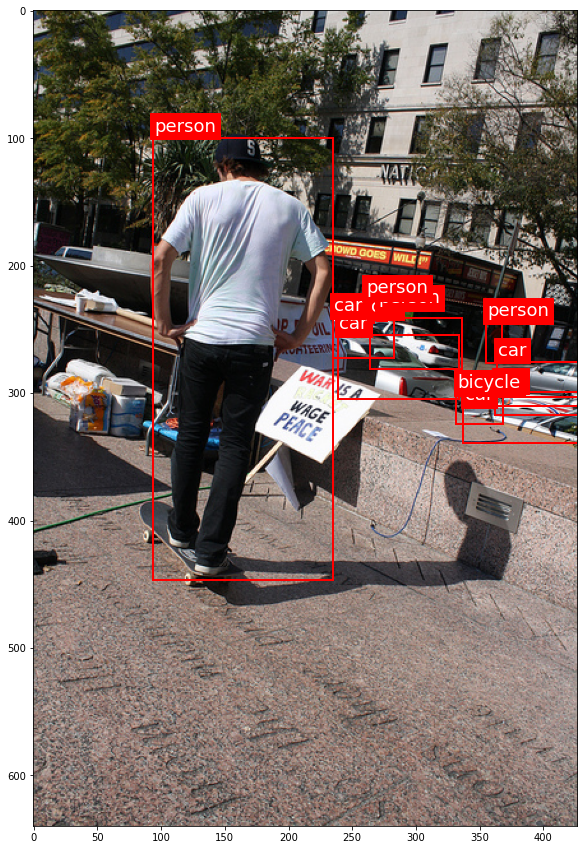

In [57]:
img_json = trainImages[np.random.randint(0, len(trainImages))]
img = cv.imread(os.path.join(TRAIN_DIR, img_json['file_name']))

ground_truths = []

annIds = cocoTrain.getAnnIds(img_json['id'], catIds=catTrainIds, iscrowd=None)
anns   = cocoTrain.loadAnns(annIds)

fig, ax = plt.subplots()

# visualize an image
img = Image.open(os.path.join(TRAIN_DIR, img_json['file_name']))

# visualize bbox im image
for ann in anns:
    ground_truth = {}

    bbox = ann['bbox']
    name_cat = cat_index_to_name[ann['category_id']]

    # extract bbox coordinates
    x = float(bbox[0])
    y = float(bbox[1])
    w = float(bbox[2])
    h = float(bbox[3])

    ground_truth["bbox"] = [x, y, w, h]
    ground_truth["label_name"] = name_cat
    ground_truths.append(ground_truth)

    # add text and bbox
    plt.text(x+1, y-5, name_cat,fontdict={'fontsize':18.0, 'fontweight':'medium','color': 'white', 'backgroundcolor':'red'})
    bb = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
    ax.add_patch(bb)

ax.imshow(img)


In [69]:
YOLOV4_CFG      = os.path.join(YOLO_SETTINGS, "yolov4.cfg")
YOLOV4_WEIGHTS  = os.path.join(YOLO_SETTINGS, "yolov4.weights")

1.6344430446624756
<class 'numpy.ndarray'>


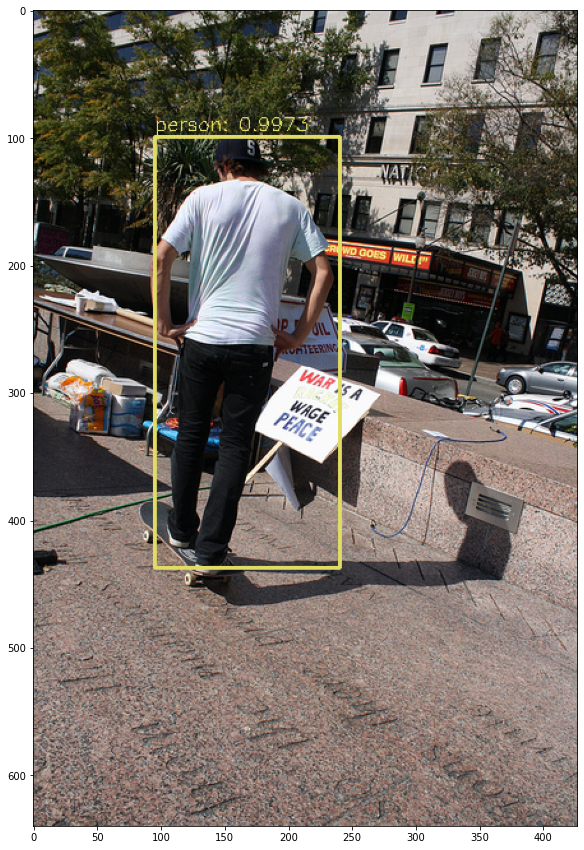

In [74]:
import yolo.src.config as config
img_js = img_json.copy()

yolo_detector = objectDetectorYolo(config.YOLOV3_CFG, config.YOLOV3_WEIGHTS, subClass=['person'], scaleFactor=1/255, conf_threshold=0.6, nms_threshold=0.4)
yolo_detector.detect_objects(img_js)

1.780750036239624
<class 'numpy.ndarray'>


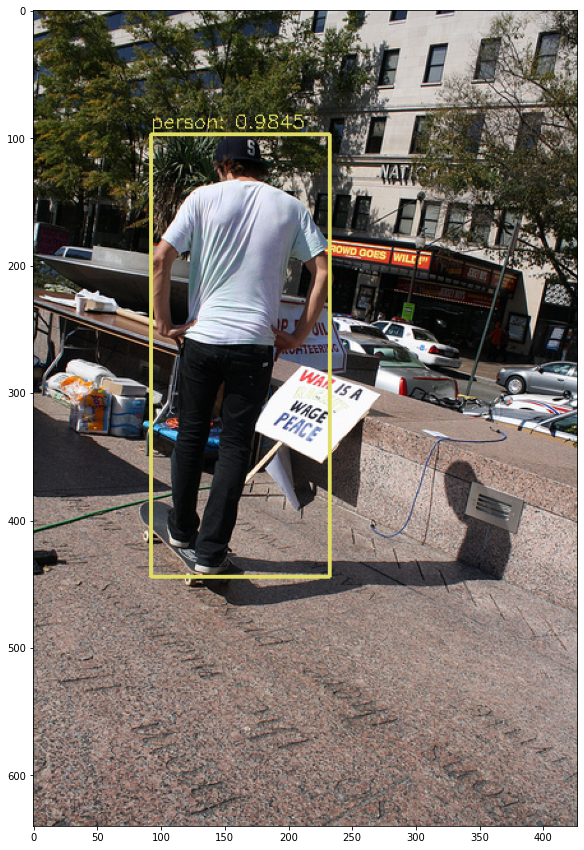

In [75]:
import yolo.src.config as config
img_js = img_json.copy()

yolo_detector = objectDetectorYolo(YOLOV4_CFG, YOLOV4_WEIGHTS, subClass=['person'], scaleFactor=1/255, conf_threshold=0.6, nms_threshold=0.4)
yolo_detector.detect_objects(img_js)

In [ ]:
preds = yolo_detector.get_preds()

## Let's implement MAP metrics into validation dataset

In [ ]:
import numpy as np

def calculate_iou(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    # Calculate coordinates of the intersection rectangle
    x_left = max(x1, x2)
    y_top = max(y1, y2)
    x_right = min(x1 + w1, x2 + w2)
    y_bottom = min(y1 + h1, y2 + h2)

    # If the boxes do not intersect, return IOU = 0
    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # Calculate the area of intersection
    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # Calculate the area of each bounding box
    box1_area = w1 * h1
    box2_area = w2 * h2

    # Calculate the Union area
    union_area = box1_area + box2_area - intersection_area

    # Calculate IOU
    iou = intersection_area / union_area
    return iou



def plt_imshow(title, image):
    # convert the image frame BGR to RGB color space and display it
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.title(title)
    plt.grid(False)
    plt.axis("off")
    plt.show()


def compute_iou(image_path):
    # load the image
    image = cv.imread(image_path)
    
    # define top-left and bottom-right coor of ground-truth
    # and predictions
    groundTruth = [20, 99, 140, 347]
    prediction  = [95, 99, 145, 338]

    # draw the ground-truth bounding box along with the predicted
    # bounding box
    cv.rectangle(image, (20, 99), (20 + 149, 99 + 347), (0, 255, 0), 2)
    cv.rectangle(image, (95, 99), (95+145, 99 + 338) ,(0, 0, 255), 2)
    # compute the intersection over union and display it
    iou = calculate_iou(groundTruth, prediction)
    cv.putText(image, "IoU: {:.4f}".format(iou), (10, 34),
        cv.FONT_HERSHEY_SIMPLEX, 1.4, (0, 255, 0), 3)

    # show the output image
    plt_imshow("Image", image)

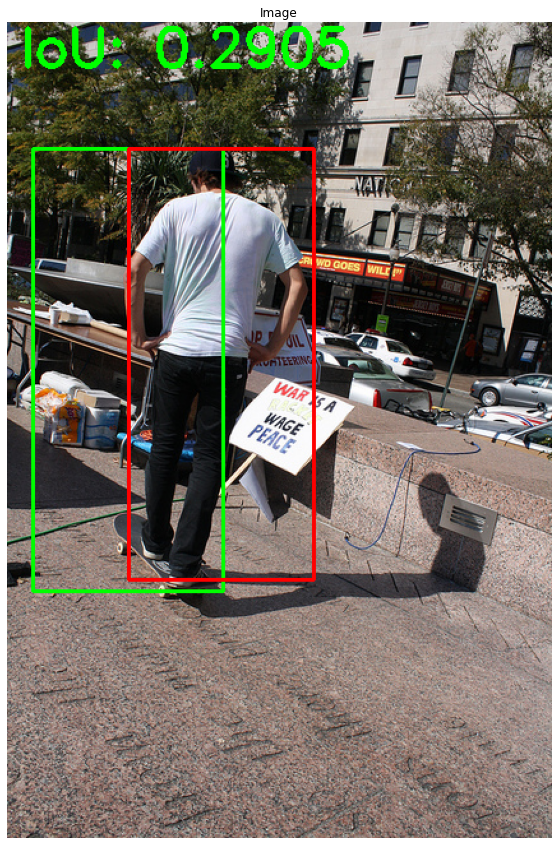

In [ ]:
imgPath = os.path.join(TRAIN_DIR, img_json['file_name'])
compute_iou(imgPath)

# How to benchmark yolov3 model using coco API

In [ ]:
from pycocotools.cocoeval import COCOeval

In [ ]:
# # create a coco result object and add the pred to it
# cocoTrainPred = cocoTrain.loadRes(preds)

# # create coco evaluation object 
# cocoEval    = COCOeval(cocoTrain, cocoTrainPred, "bbox")

# # run evaluation for each image, accumulates per image results
# # display the summary metrics of the evaluation
# cocoEval.evaluate()
# cocoEval.accumulate()
# cocoEval.summarize()

Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
